In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

## Escala de cinza


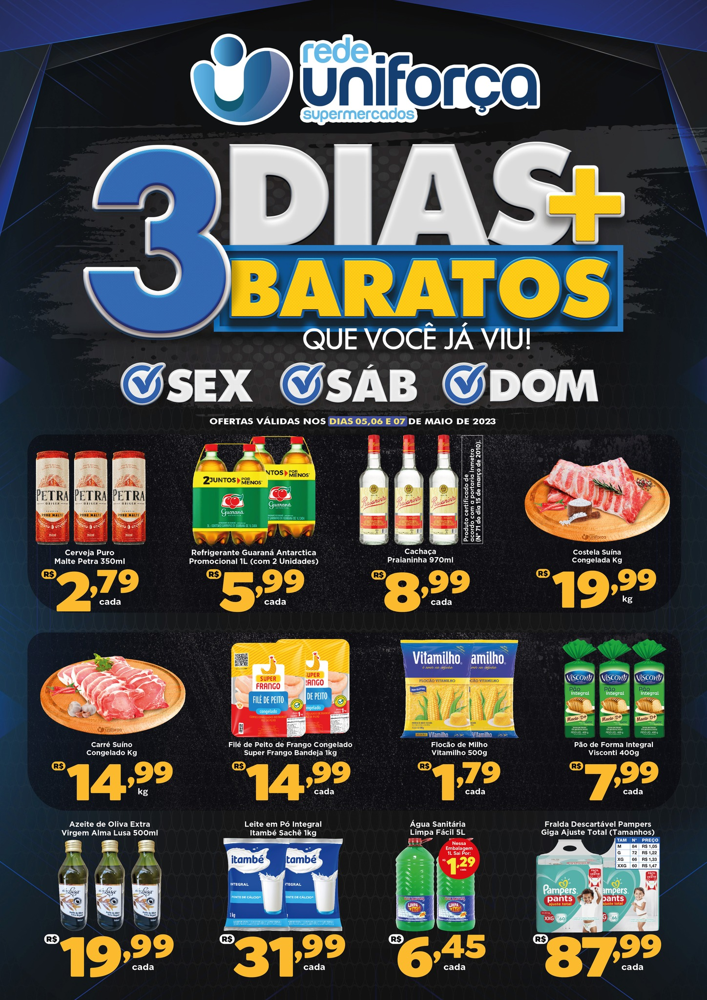

In [2]:
img = cv2.imread('/content/img/imagem_pdi.jpg')
cv2_imshow(img)

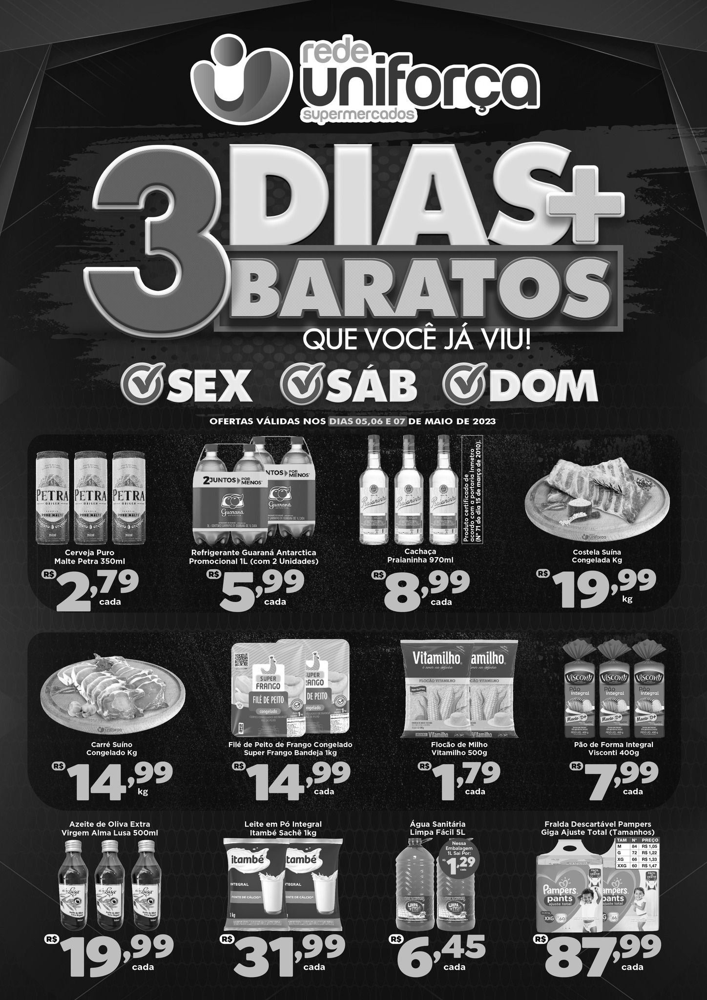

In [3]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

## Limiarização

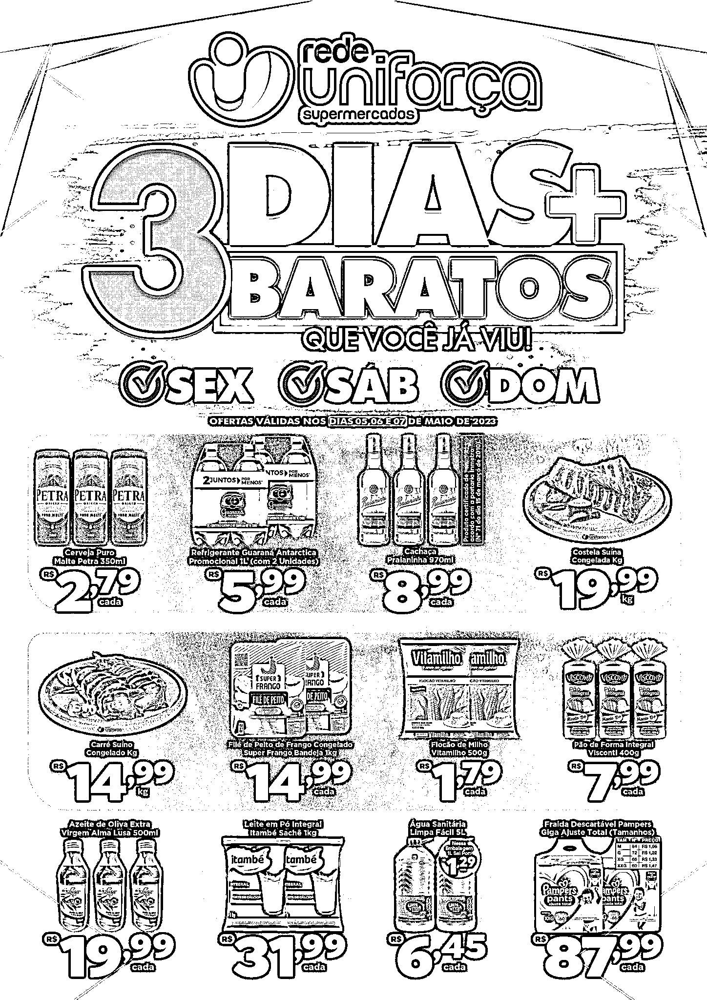

In [4]:
adapt_media = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 9)
cv2_imshow(adapt_media)     

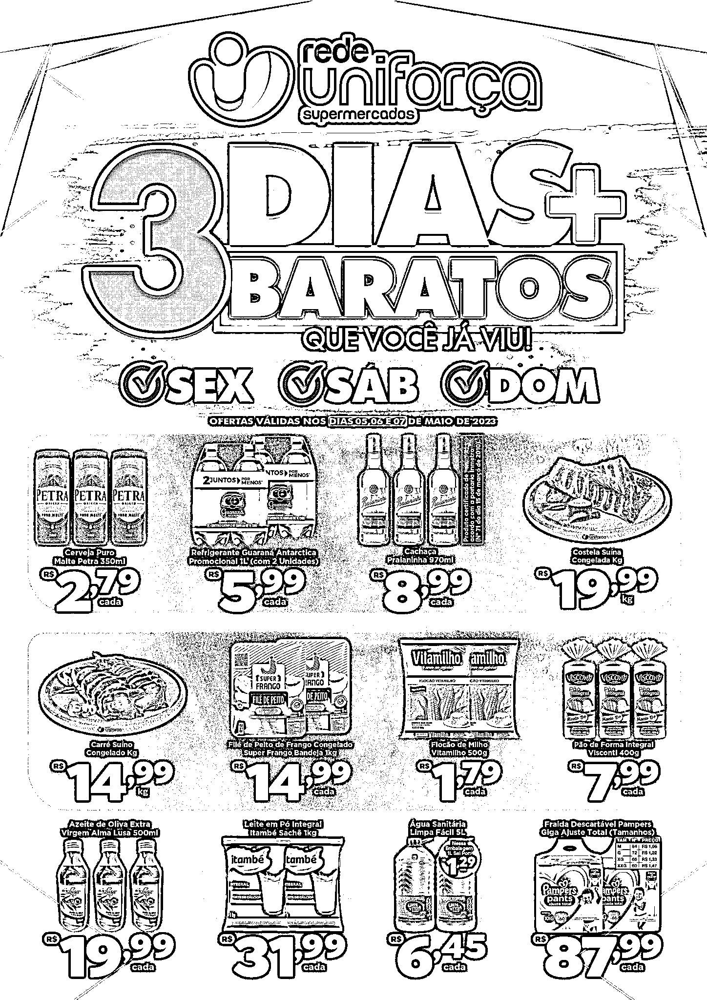

In [5]:
adapt_media = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 9)
cv2_imshow(adapt_media)

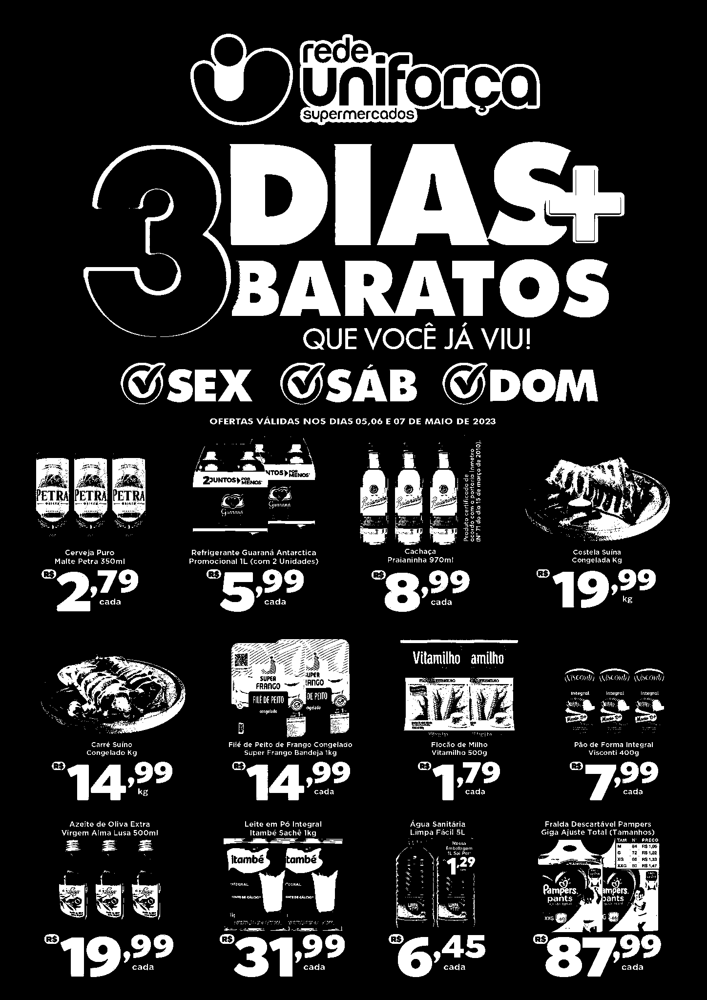

180.0


In [6]:
val, thresh = cv2.threshold(gray, 180, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh)
print(val)

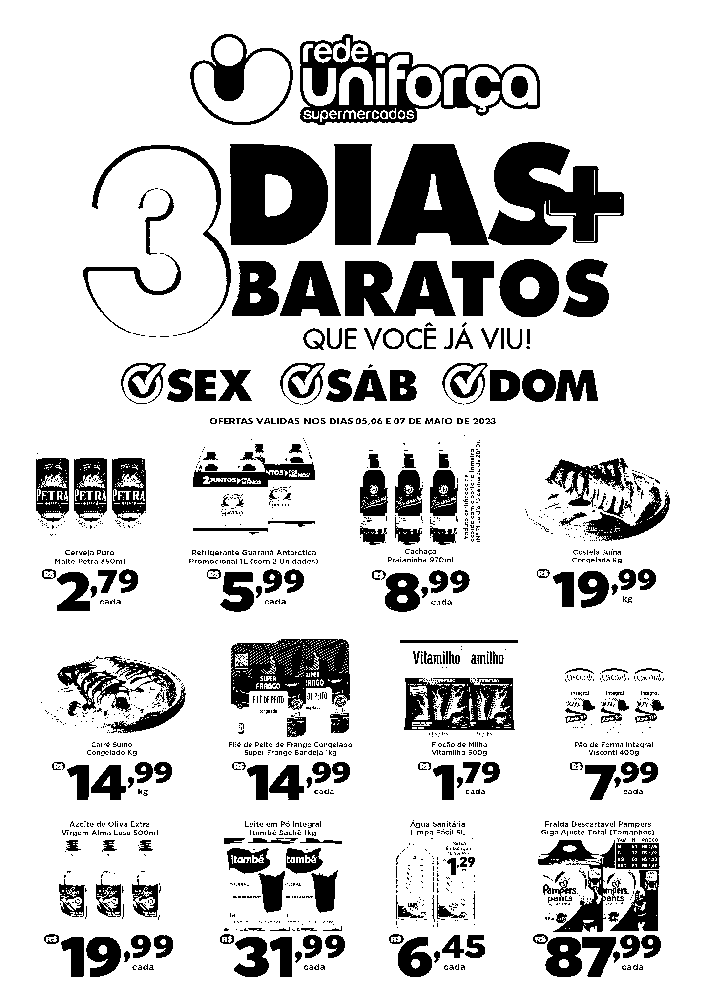

In [7]:
invert = 255 - thresh
cv2_imshow(invert)

In [7]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 28 not upgraded.
Need to get 4,850 kB of archives.
After this operation, 16.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1 [1,598 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr amd64 4.1.1-2build2 [262 kB]
Fetched 4,850 kB in 1s (6,092 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/Fro

In [9]:
import pytesseract

In [6]:
!mkdir tessdata
!wget -O ./tessdata/por.traineddata https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true

--2023-05-25 00:22:07--  https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true
Resolving github.com (github.com)... 192.30.255.113
Connecting to github.com (github.com)|192.30.255.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/tesseract-ocr/tessdata/raw/main/por.traineddata [following]
--2023-05-25 00:22:07--  https://github.com/tesseract-ocr/tessdata/raw/main/por.traineddata
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/tesseract-ocr/tessdata/main/por.traineddata [following]
--2023-05-25 00:22:07--  https://raw.githubusercontent.com/tesseract-ocr/tessdata/main/por.traineddata
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent,

In [13]:
config_tesseract = '--tessdata-dir tessdata'
texto = pytesseract.image_to_string(invert, lang='por', config=config_tesseract)
print(texto)

 

Ssupermercados

 

%3'1!&%

QUE VOCÊ JÁ VIU!

COSEX USAB UÚDOM

OFERTAS VÁLIDAS NOS DIAS 05,06 E 07 DE MAIO DE 2023

e l À

  

     

ê
"
.,l SA e
=m É
la o ee
ESA 38
22
208
F
Cerveja Puro Refrigerante Guaraná Antarctica Cachaça Costela Suína
Malte Petra 350ml Promocional 1L (com 2 Unidades) Praianinha 970m! Congelada Kg

21 "5 8 29 19

Vitamilho amílho

 

s a m,
Wisconty WICcom WICON

       
 

imtegrat — mtegral — Integral

   

 

FHÉDE PEITO e n
em em e
. & UE ss
=
Carré Suíno Filé de Peito de Frango Congelado Flocção de Milho Pão de Forma Integral
Congelado Kg Super Frango Bandeja Ikg Vitamilho 500g Visconti 4009
? 99
kg cada cada
Azeite de Oliva Extra Leite em Pó Integral Água Sanitária Fralda Descartável Pampers
Virgem Alma Lusa 500m! Itambé Sachê Ikg Limpa Fácil 5L Giga Ajuste Total (Tamanhos)

    
 
  

19 31

ENTA
ENEA
SE

 



In [16]:
print(pytesseract.image_to_string('teste.png', lang='por', config=config_tesseract))

Cerveja Puro
Malte Petra 350m|

cada



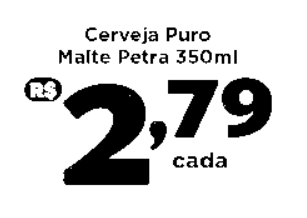

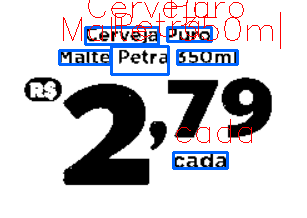

In [61]:
from pytesseract import Output

img = cv2.imread('/content/teste.png')
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2_imshow(rgb)

def caixa_texto(resultado, img, cor = (255, 100, 0)):
  x = resultado['left'][i]
  y = resultado['top'][i]
  w = resultado['width'][i]
  h = resultado['height'][i]

  cv2.rectangle(img, (x, y), (x + w, y + h), cor, 2)

  return x, y, img

min_conf = 40

config_tesseract = '--tessdata-dir tessdata'
resultado = pytesseract.image_to_data(rgb, config=config_tesseract, lang='por', output_type=Output.DICT)
resultado

img_copia = rgb.copy()
for i in range(0, len(resultado['text'])):
  #print(i)
  confianca = int(resultado['conf'][i])
  #print(confianca)
  if confianca > min_conf:
    x, y, img = caixa_texto(resultado, img_copia)
    #print(x, y)
    texto = resultado['text'][i]
    cv2.putText(img_copia, texto, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0,0,255))
cv2_imshow(img_copia)

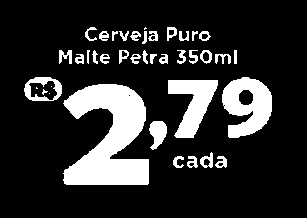

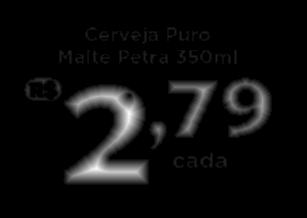

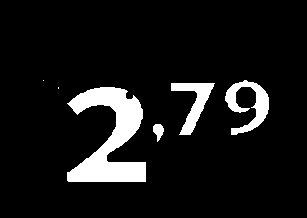

In [26]:
# import the necessary packages
import numpy as np
import pytesseract
import argparse
import imutils
import cv2
from google.colab.patches import cv2_imshow

# load the input image and convert it to grayscale
image = cv2.imread('/content/teste.png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# threshold the image using Otsu's thresholding method
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cv2_imshow(thresh)


dist = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
# normalize the distance transform such that the distances lie in
# the range [0, 1] and then convert the distance transform back to
# an unsigned 8-bit integer in the range [0, 255]
dist = cv2.normalize(dist, dist, 0, 1.0, cv2.NORM_MINMAX)
dist = (dist * 255).astype("uint8")
cv2_imshow(dist)
# threshold the distance transform using Otsu's method
dist = cv2.threshold(dist, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
cv2_imshow(dist)


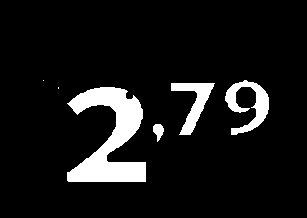

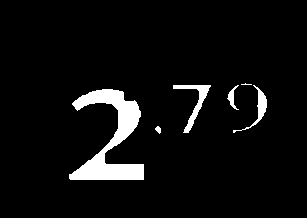

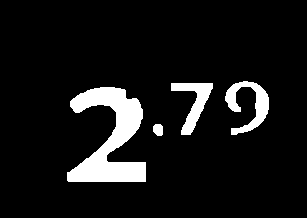

In [28]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
opening = cv2.morphologyEx(dist, cv2.MORPH_OPEN, kernel)
#cv2_imshow(opening)


erosao = cv2.erode(dist, np.ones((5, 5), np.uint8))
abertura = cv2.dilate(erosao, np.ones((5,5), np.uint8))
cv2_imshow(dist)
cv2_imshow(erosao)
cv2_imshow(abertura)

In [54]:
cnts = cv2.findContours(dist.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
chars = []
# loop over the contours
for c in cnts:
	# compute the bounding box of the contour
  (x, y, w, h) = cv2.boundingRect(c)
  # check if contour is at least 35px wide and 100px tall, and if
  # so, consider the contour a digit
  print(w)
  print(h)
  if w >= 20 and h >= 50:
    chars.append(c)

11
18
79
95
1
2
44
52
44
55
1
1


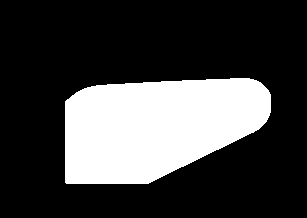

In [55]:
chars = np.vstack([chars[i] for i in range(0, len(chars))])
hull = cv2.convexHull(chars)
# allocate memory for the convex hull mask, draw the convex hull on
# the image, and then enlarge it via a dilation
mask = np.zeros(image.shape[:2], dtype="uint8")
cv2.drawContours(mask, [hull], -1, 255, -1)
mask = cv2.dilate(mask, None, iterations=2)
cv2_imshow(mask)
# take the bitwise of the opening image and the mask to reveal *just*
# the characters in the image
final = cv2.bitwise_and(opening, opening, mask=mask)

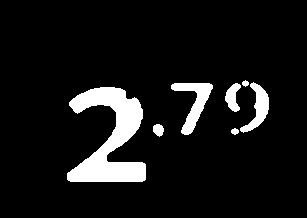

-1

In [56]:
# OCR the input image using Tesseract
options = "--psm 8 -c tessedit_char_whitelist=0123456789"
text = pytesseract.image_to_string(final, config=options)
print(text)
# show the final output image
cv2_imshow(final)
cv2.waitKey(0)

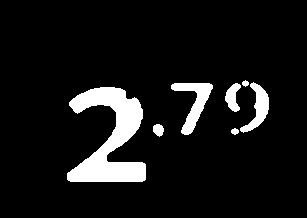

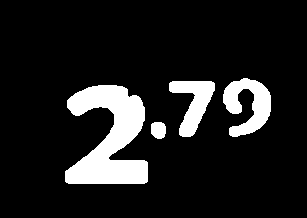

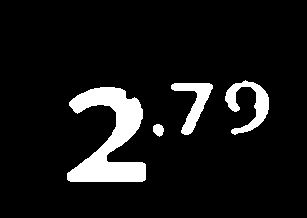

In [57]:
dilatacao = cv2.dilate(final, np.ones((5,5)))
fechamento = cv2.erode(dilatacao, np.ones((5,5)))
cv2_imshow(final)
cv2_imshow(dilatacao)
cv2_imshow(fechamento)

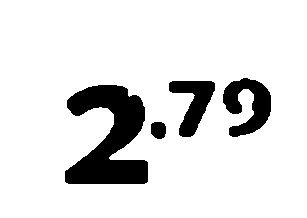

In [53]:
invert = 255 - dilatacao
cv2_imshow(invert)

In [59]:
print(pytesseract.image_to_string(invert, lang='por', config=config_tesseract))

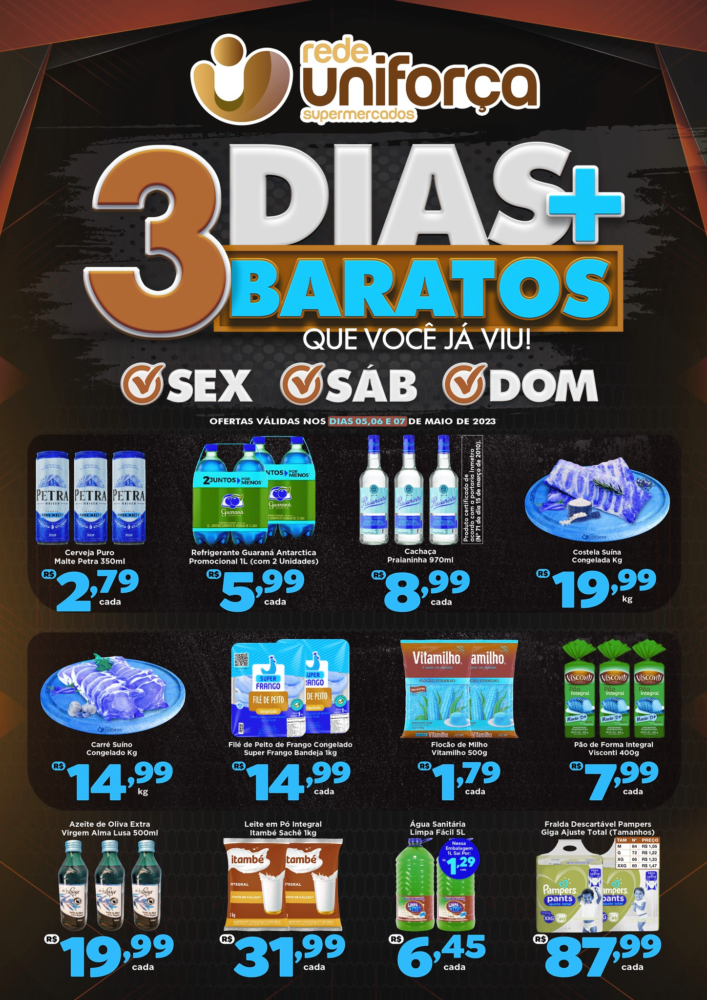

In [76]:
img = cv2.imread('/content/img/imagem_pdi.jpg')
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2_imshow(rgb)

In [77]:
config_tesseract = "--tessdata-dir tessdata"
resultado = pytesseract.image_to_data(rgb, config=config_tesseract, lang="por", output_type=Output.DICT)
resultado

{'level': [1,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  3,
  4,
  5,
  5,
  5,
  5,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  4,
  5,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  5,
  5,
  5,
  4,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  5,
  5,
  4,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  5,
  5,
  5,
  4,
  5,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  5,
  2,
  3,
  4,
  5,
  5,
  4,
  5,
  5,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  2,
  3,
  4,
  5,
  5,
  2,
  3,
  4,
 

In [78]:
# https://regexr.com/
import regex as re
padrao_data = '[0-9]{0,15}[,]{0,1}[0-9]{0,4}'

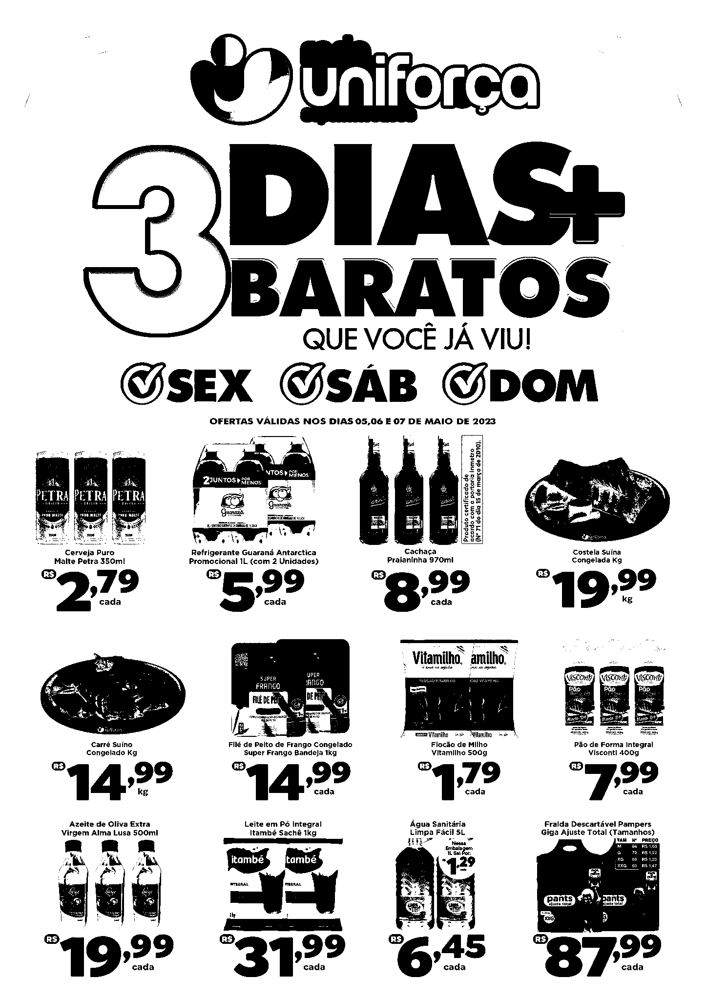

0
Dígito encontrado: 


In [86]:
import cv2
import pytesseract

# Carregar a imagem
imagem = cv2.imread('/content/img/imagem_pdi.jpg')

# Converter a imagem para tons de cinza
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

# Aplicar uma transformação de limiarização para segmentar os dígitos
_, imagem_limiarizada = cv2.threshold(imagem_cinza, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Realizar detecção de contornos na imagem limiarizada
contornos, _ = cv2.findContours(imagem_limiarizada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2_imshow(imagem_limiarizada)
# Loop pelos contornos encontrados
for contorno in contornos:
    # Obter as coordenadas do retângulo delimitador do contorno
    (x, y, w, h) = cv2.boundingRect(contorno)
    print(x)
    # Extrair o dígito da imagem original com base nas coordenadas do retângulo
    digito = imagem[y:y+h, x:x+w]
    
    # Pré-processamento adicional (opcional) na imagem do dígito, se necessário
    
    # Reconhecimento do dígito usando Tesseract OCR
    resultado = pytesseract.image_to_string(digito, config='--psm 10 --oem 3 -c tessedit_char_whitelist=0123456789')
    
    # Exibir o resultado
    print("Dígito encontrado:", resultado)


In [85]:
contornos

(array([[[   0,    0]],
 
        [[   0, 2047]],
 
        [[1447, 2047]],
 
        [[1447,    0]]], dtype=int32),)

In [79]:
from PIL import ImageFont, ImageDraw, Image
fonte = '/content/calibri.ttf'

In [80]:
def escreve_texto(texto, x, y, img, fonte, tamanho_texto=32):
  fonte = ImageFont.truetype(fonte, tamanho_texto)
  img_pil = Image.fromarray(img)
  draw = ImageDraw.Draw(img_pil)
  draw.text((x, y - tamanho_texto), texto, font = fonte)
  img = np.array(img_pil)
  return img

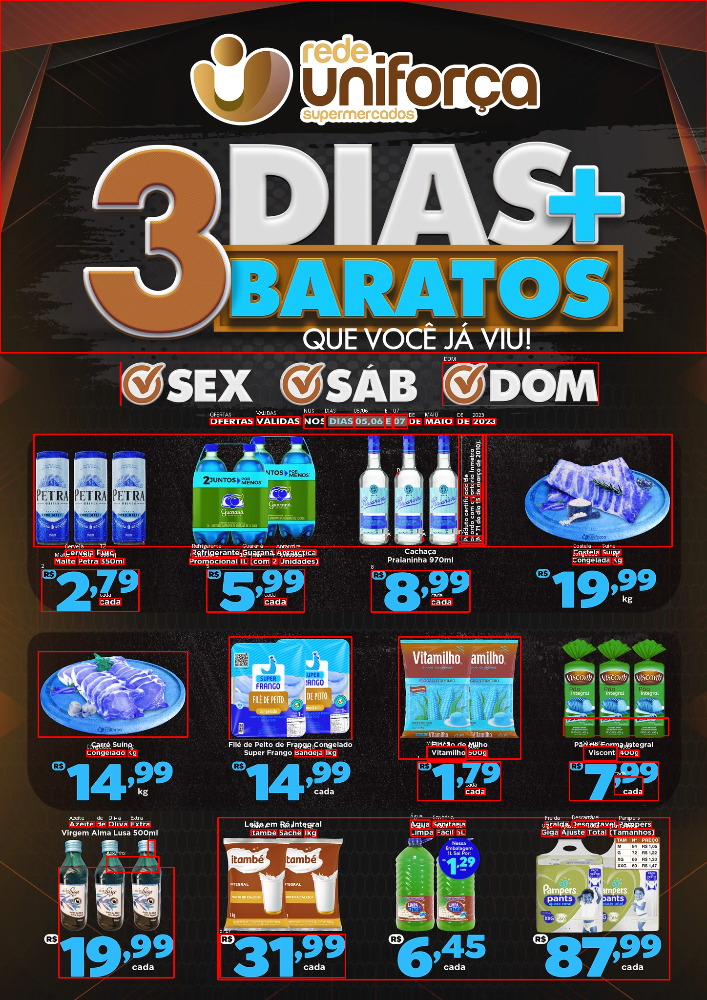

In [81]:
datas = []
img_copia = rgb.copy()
for i in range(0, len(resultado['text'])):
  confianca = int(resultado['conf'][i])
  if confianca > min_conf:
    texto = resultado['text'][i]
    if re.match(padrao_data, texto):
      x, y, img = caixa_texto(resultado, img_copia, (0,0,255))
      img_copia = escreve_texto(texto, x, y, img_copia, fonte, 12)
      datas.append(texto)
    else:
      x, y, img_copia = caixa_texto(resultado, img_copia)
cv2_imshow(img_copia)

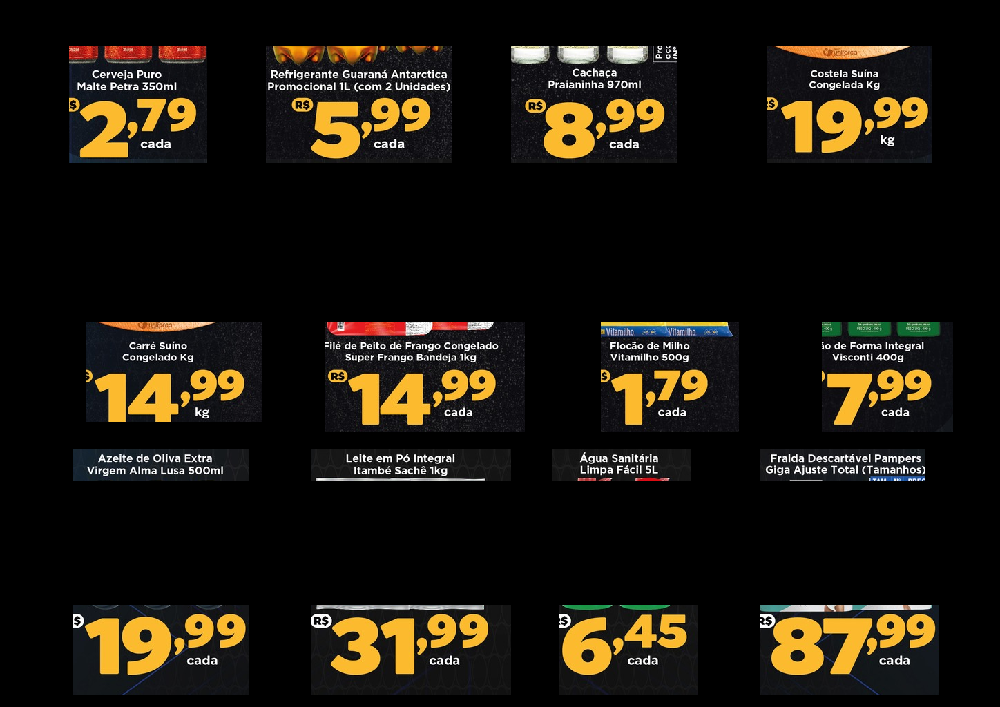

In [205]:
import cv2
import numpy as np

# Carregar a imagem
imagem = cv2.imread('/content/img/imagem_pdi.jpg')

# Definir as coordenadas das ROIs
rois = [
    (100, 1090, 200, 170),  # Exemplo de ROI: (x, y, largura, altura)
    (385, 1090, 270, 170),  # Exemplo de ROI: (x, y, largura, altura)
    (740, 1090, 240, 170),
    (1110, 1090, 240, 170),

    (125, 1490, 255, 145),  # Exemplo de ROI: (x, y, largura, altura)
    (470, 1490, 290, 160),  # Exemplo de ROI: (x, y, largura, altura)
    (870, 1490, 200, 160),
    (1190, 1490, 190, 160),

    (105, 1675, 255, 45),  # Exemplo de ROI: (x, y, largura, altura)
    (450, 1675, 290, 45),  # Exemplo de ROI: (x, y, largura, altura)
    (800, 1675, 200, 45),
    (1100, 1675, 240, 45),

    (105, 1900, 255, 130),  # Exemplo de ROI: (x, y, largura, altura)
    (450, 1900, 290, 130),  # Exemplo de ROI: (x, y, largura, altura)
    (810, 1900, 200, 130),
    (1100, 1900, 260, 130),
]

"""(105, 1500, 255, 220),  # Exemplo de ROI: (x, y, largura, altura)
    (450, 1500, 290, 220),  # Exemplo de ROI: (x, y, largura, altura)
    (850, 1500, 200, 220),
    (1170, 1500, 190, 220),"""
# Criar uma imagem vazia para armazenar as ROIs
imagem_roi = np.zeros_like(imagem)

# Loop pelas ROIs
for roi in rois:
    x, y, w, h = roi
    
    # Extrair a ROI da imagem original com base nas coordenadas
    roi_imagem = imagem[y:y+h, x:x+w]
    
    # Copiar a ROI extraída para a imagem das ROIs
    imagem_roi[y:y+h, x:x+w] = roi_imagem

altura, largura, _ = imagem_roi.shape
img_red = imagem_roi[altura//2:altura, :]
# Exibir a imagem das ROIs
cv2_imshow(img_red)
cv2.waitKey(0)
cv2.destroyAllWindows()


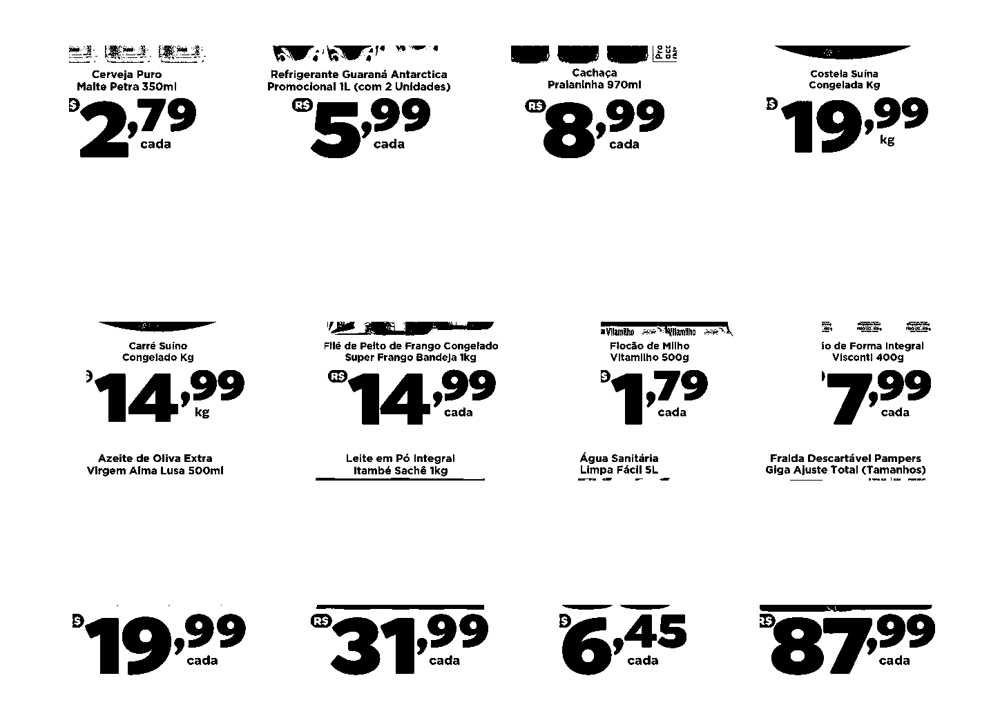

0
Dígito encontrado: 


In [206]:
import cv2
import pytesseract

# Carregar a imagem
imagem = cv2.imread('/content/img/imagem_pdi.jpg')

# Converter a imagem para tons de cinza
imagem_cinza = cv2.cvtColor(img_red, cv2.COLOR_BGR2GRAY)

# Aplicar uma transformação de limiarização para segmentar os dígitos
_, imagem_limiarizada = cv2.threshold(imagem_cinza, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Realizar detecção de contornos na imagem limiarizada
contornos, _ = cv2.findContours(imagem_limiarizada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2_imshow(imagem_limiarizada)
# Loop pelos contornos encontrados
for contorno in contornos:
    # Obter as coordenadas do retângulo delimitador do contorno
    (x, y, w, h) = cv2.boundingRect(contorno)
    print(x)
    # Extrair o dígito da imagem original com base nas coordenadas do retângulo
    digito = imagem[y:y+h, x:x+w]
    
    # Pré-processamento adicional (opcional) na imagem do dígito, se necessário
    
    # Reconhecimento do dígito usando Tesseract OCR
    resultado = pytesseract.image_to_string(digito, config='--psm 10 --oem 3 -c tessedit_char_whitelist=0123456789')
    
    # Exibir o resultado
    print("Dígito encontrado:", resultado)

In [207]:
print(pytesseract.image_to_string(img_red, lang='por', config=config_tesseract))

iZA ZM E — ::: i o
KTTNAA Refrigerante Guaraná Antarctica Cachaça Costela Suína
Malte Peua 350m| Promoclonal L (com F Unldades) gn TNE A Congelada Kg

XS
cada cada cada L

 

een e eeA TTTEEETTES NE NE

Carré Suíno Filé de Peito de Frango Congelado Flocão de Milho o de Forma Integral
Congelado Kg super [Eeuco Bandela lkg Vitamilho soog Visconti 4009
| 99 "
A cada cada cada
Azeite de Oliva Extra R NA ENTA Água Sanitária Fralda Descartável Pampers

Virgem Alma Lusa 500ml

 

també Sachê 1kg Limpa Fácil 5L Giga Ajuste Total (Tamanhos)

 

 

 

cada cada cada cada



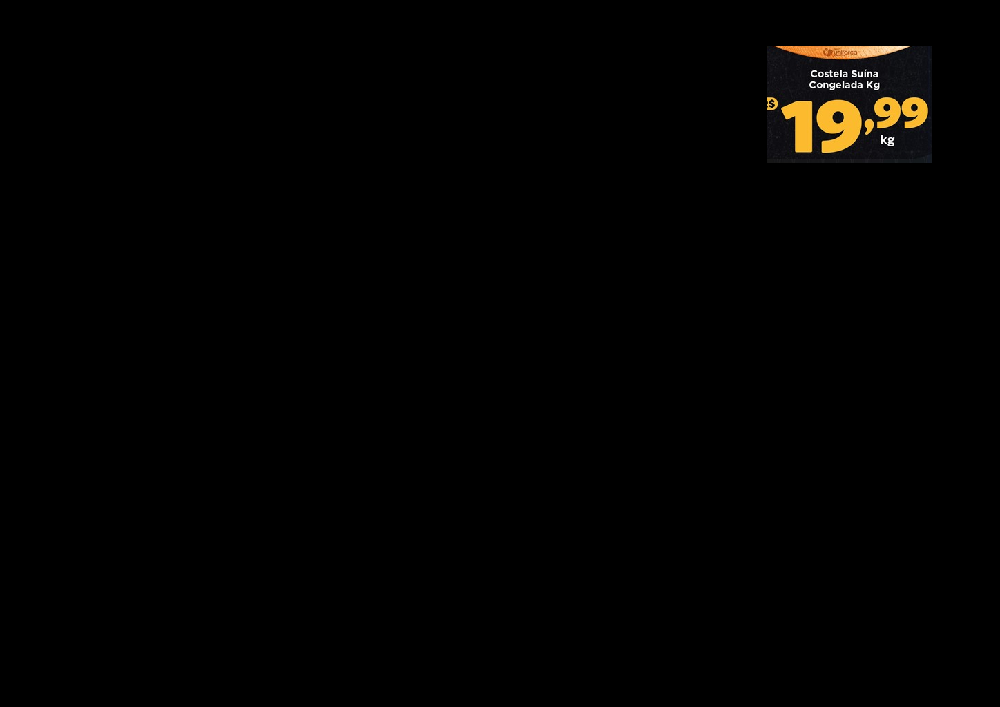

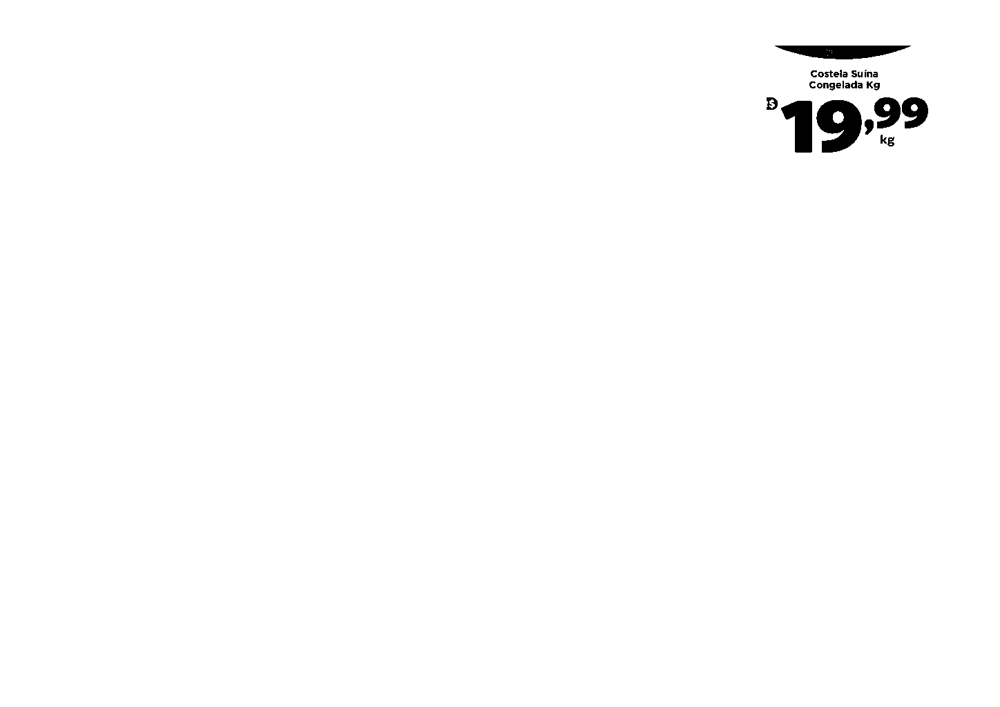

ssssssssssss



In [212]:
# Carregar a imagem
imagem = cv2.imread('/content/img/imagem_pdi.jpg')

# Definir as coordenadas das ROIs
rois = [
    #(100, 1090, 200, 170),  # Exemplo de ROI: (x, y, largura, altura)
    #(385, 1090, 270, 170),  # Exemplo de ROI: (x, y, largura, altura)
    #(740, 1090, 240, 170),
    (1110, 1090, 240, 170),
]

"""(105, 1500, 255, 220),  # Exemplo de ROI: (x, y, largura, altura)
    (450, 1500, 290, 220),  # Exemplo de ROI: (x, y, largura, altura)
    (850, 1500, 200, 220),
    (1170, 1500, 190, 220),"""
# Criar uma imagem vazia para armazenar as ROIs
imagem_roi = np.zeros_like(imagem)

# Loop pelas ROIs
for roi in rois:
    x, y, w, h = roi
    
    # Extrair a ROI da imagem original com base nas coordenadas
    roi_imagem = imagem[y:y+h, x:x+w]
    
    # Copiar a ROI extraída para a imagem das ROIs
    imagem_roi[y:y+h, x:x+w] = roi_imagem

altura, largura, _ = imagem_roi.shape
img_red = imagem_roi[altura//2:altura, :]
# Exibir a imagem das ROIs
cv2_imshow(img_red)
cv2.waitKey(0)
cv2.destroyAllWindows()


import cv2
import pytesseract

# Carregar a imagem
imagem = cv2.imread('/content/img/imagem_pdi.jpg')

# Converter a imagem para tons de cinza
imagem_cinza = cv2.cvtColor(img_red, cv2.COLOR_BGR2GRAY)

# Aplicar uma transformação de limiarização para segmentar os dígitos
_, imagem_limiarizada = cv2.threshold(imagem_cinza, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Realizar detecção de contornos na imagem limiarizada
contornos, _ = cv2.findContours(imagem_limiarizada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2_imshow(imagem_limiarizada)


print(pytesseract.image_to_string(img_red, lang='por', config=config_tesseract))


In [3]:
!pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [12]:
import cv2
import pytesseract

config_tesseract = '--tessdata-dir tessdata'
#texto = pytesseract.image_to_string(imagem, lang='por', config=config_tesseract)
#print(texto)

# Carregar a imagem
imagem = cv2.imread('/content/imagem_binarizada_otsu.jpg')

print(pytesseract.image_to_string(imagem, lang='por', config=config_tesseract))

Cerveja Puro Refrigerante Guaraná Antarctica
Malh Peua 350m| Promoclonal n (com 2 Unldadts)

cada cada

Carré Suíno FHlé de Pelto de Frango Congelado
Congetado Kg super Erango eande]a Ikg

4:ºº

Azelte de Oliva Extra Lelte em Pó Integral
Virgem Alma Lusa 500m! Itambé Sachê lkg

B,

cada cada

Cachaça
Pralaninha 970ml

cada

Flocão de Milho
Vitamilho soºg

cada

Água Sanlitária
Limpa Fácil 5L —

S

cada

Costela Suína
Congelada Kg

Pão de Forma Integral
Viscontl 4009

cada

Fralda Descartável Pampers
Glga Ajuste Total (Tamanhos)

 

D,

cada



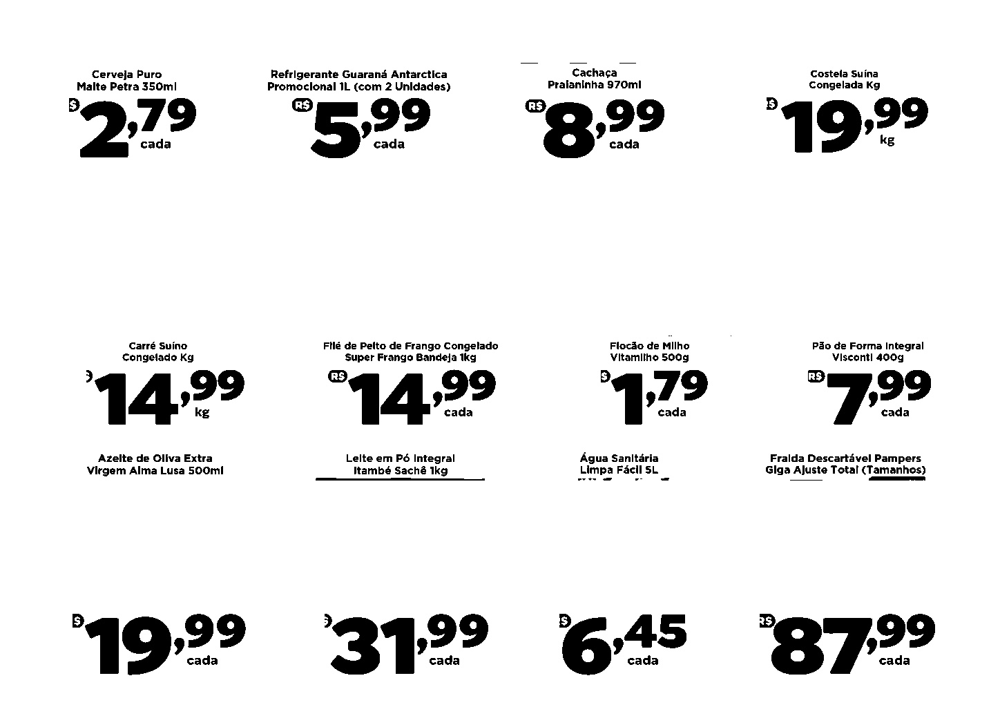

In [11]:
cv2_imshow(imagem)